In [4]:
import osmnx as ox
import numpy as np
import matplotlib.pyplot as plt
from descartes import PolygonPatch
from shapely.geometry import MultiPolygon
from shapely.geometry import Polygon

## Showing basic functionality

In [49]:
# function to get all cycleways in a city
def get_cycleways(city_name):
    useful_tags = ox.settings.useful_tags_way + ['cycleway']
    ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
    G = ox.graph_from_place(query = city_name, network_type='bike', simplify=False)
    non_cycleways = [(u, v, k) for u, v, k, d in G.edges(keys=True, data=True) if not ('cycleway' in d or d['highway']=='cycleway')]
    G.remove_edges_from(non_cycleways)
    G = ox.utils_graph.remove_isolated_nodes(G)
    return cycleways

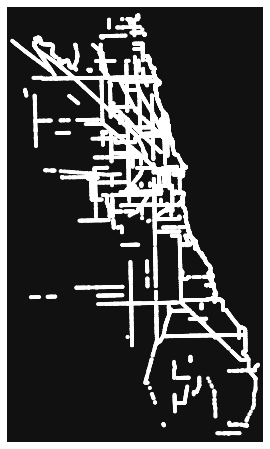

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [39]:
# plot cycleways
city_name = 'Chicago, Illinois'
cycleways = get_cycleways(city_name)
ox.plot_graph(cycleways)

In [50]:
# get outline of city area
city_area = ox.geocode_to_gdf(city_name)

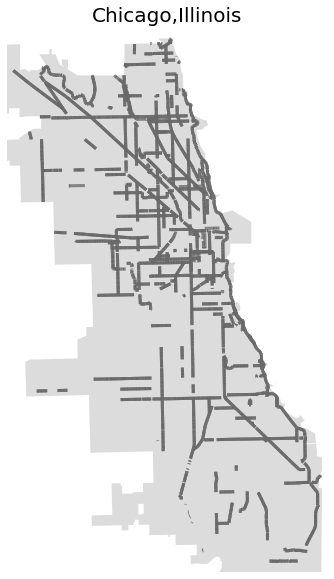

In [65]:
# plot cycleways overlaid city area
fig, ax = plt.subplots(figsize=(10,10))
ax.set_title(city_name,fontsize=20)
city_area.plot(ax=ax, facecolor='gainsboro')
ox.plot_graph(cycleways,ax=ax,node_size=0,edge_linewidth=3,edge_color='dimgrey')
ax.axis('off')

fig.savefig('test.png',dpi=500)

## All together in one function

In [92]:
def plot_cycleways(city_name):
    # get cycleways 
    cycleways = get_cycleways(city_name)
    # get city area
    city_area = ox.geocode_to_gdf(city_name)
    
    # plot cycleways overlaid city area
    fig, ax = plt.subplots(figsize=(4,4))
    ax.set_title(city_name,fontsize=20)
    city_area.plot(ax=ax, facecolor='gainsboro')
    ox.plot_graph(cycleways,ax=ax,node_size=0,edge_linewidth=2,edge_color='dimgrey')
    ax.axis('off')

    return fig, cycleways, city_area

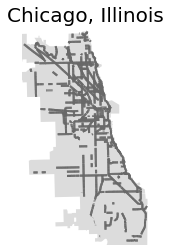

In [93]:
city_name = 'Chicago, Illinois'
fig,cycleways,city_area = plot_cycleways(city_name)
# fig.savefig(f'{city_name}',dpi=1000)

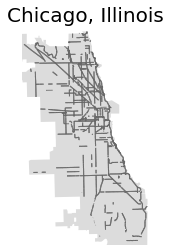

In [96]:
fig, ax = plt.subplots(figsize=(4,4))
ax.set_title(city_name,fontsize=20)
city_area.plot(ax=ax, facecolor='gainsboro')
ox.plot_graph(cycleways,ax=ax,node_size=0,edge_linewidth=1,edge_color='dimgrey')
ax.axis('off')

fig.savefig('test.png',dpi=1000)

In [ ]:
import winsound
winsound.PlaySound("SystemExit",winsound.SND_ALIAS)